In [1]:
# import libraries
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os, re, time, math, itertools
from tqdm import tqdm
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.offline as pyo
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
import tensorflow as tf
from tensorflow.keras.layers import LSTM 
from tensorflow.keras import backend  
from tensorflow.keras.layers import Conv2D, Conv1D, MaxPooling2D, MaxPooling1D, Flatten, BatchNormalization, Dense, Input
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import CSVLogger, ModelCheckpoint

In [3]:
for dirname, _, filenames in os.walk('H:/Internetworking/Full_atk_zscore_7_threshold_099'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

H:/Internetworking/Full_atk_zscore_7_threshold_099\Full_atk_zscore_7_threshold_099.csv


In [4]:
network_data = pd.read_csv('H:/Internetworking/Full_atk_zscore_7_threshold_099/Full_atk_zscore_7_threshold_099.csv')

In [5]:
# check the shape of data
network_data.shape

(7214096, 71)

In [6]:
# check the columns in data
network_data.columns

Index(['Dst Port', 'Protocol', 'Timestamp', 'Flow Duration', 'Tot Fwd Pkts',
       'Tot Bwd Pkts', 'TotLen Fwd Pkts', 'TotLen Bwd Pkts', 'Fwd Pkt Len Max',
       'Fwd Pkt Len Min', 'Fwd Pkt Len Mean', 'Fwd Pkt Len Std',
       'Bwd Pkt Len Max', 'Bwd Pkt Len Min', 'Bwd Pkt Len Mean',
       'Bwd Pkt Len Std', 'Flow Byts/s', 'Flow Pkts/s', 'Flow IAT Mean',
       'Flow IAT Std', 'Flow IAT Max', 'Flow IAT Min', 'Fwd IAT Tot',
       'Fwd IAT Mean', 'Fwd IAT Std', 'Fwd IAT Max', 'Fwd IAT Min',
       'Bwd IAT Tot', 'Bwd IAT Mean', 'Bwd IAT Std', 'Bwd IAT Max',
       'Bwd IAT Min', 'Fwd PSH Flags', 'Fwd Header Len', 'Bwd Header Len',
       'Fwd Pkts/s', 'Bwd Pkts/s', 'Pkt Len Min', 'Pkt Len Max',
       'Pkt Len Mean', 'Pkt Len Std', 'Pkt Len Var', 'FIN Flag Cnt',
       'SYN Flag Cnt', 'RST Flag Cnt', 'PSH Flag Cnt', 'ACK Flag Cnt',
       'URG Flag Cnt', 'ECE Flag Cnt', 'Down/Up Ratio', 'Pkt Size Avg',
       'Fwd Seg Size Avg', 'Bwd Seg Size Avg', 'Subflow Fwd Pkts',
       'Subflow

In [7]:
# check the number of columns
print('Total columns in our data: %s' % str(len(network_data.columns)))

Total columns in our data: 71


In [8]:
network_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7214096 entries, 0 to 7214095
Data columns (total 71 columns):
 #   Column             Dtype  
---  ------             -----  
 0   Dst Port           float64
 1   Protocol           float64
 2   Timestamp          float64
 3   Flow Duration      float64
 4   Tot Fwd Pkts       float64
 5   Tot Bwd Pkts       float64
 6   TotLen Fwd Pkts    float64
 7   TotLen Bwd Pkts    float64
 8   Fwd Pkt Len Max    float64
 9   Fwd Pkt Len Min    float64
 10  Fwd Pkt Len Mean   float64
 11  Fwd Pkt Len Std    float64
 12  Bwd Pkt Len Max    float64
 13  Bwd Pkt Len Min    float64
 14  Bwd Pkt Len Mean   float64
 15  Bwd Pkt Len Std    float64
 16  Flow Byts/s        float64
 17  Flow Pkts/s        float64
 18  Flow IAT Mean      float64
 19  Flow IAT Std       float64
 20  Flow IAT Max       float64
 21  Flow IAT Min       float64
 22  Fwd IAT Tot        float64
 23  Fwd IAT Mean       float64
 24  Fwd IAT Std        float64
 25  Fwd IAT Max       

In [9]:
# check the number of values for labels
network_data['Label'].value_counts()

Label
Benign                      4836398
DDoS attacks-LOIC-HTTP       573347
DoS attacks-Hulk             439126
DDOS attack-HOIC             360833
Bot                          285763
FTP-BruteForce               193354
SSH-Bruteforce               187589
Infilteration                152874
DoS attacks-SlowHTTPTest     139890
DoS attacks-GoldenEye         39924
DoS attacks-Slowloris          2724
DDOS attack-LOIC-UDP           1730
Brute Force -Web                350
Brute Force -XSS                116
SQL Injection                    78
Name: count, dtype: int64

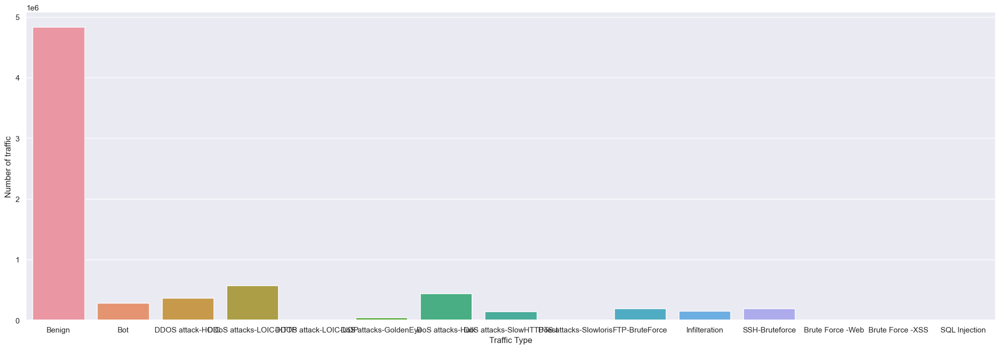

In [13]:
# make a plot number of labels
sns.set(rc={'figure.figsize':(25, 8)})
plt.xlabel('Traffic Type')
sns.set_theme()
ax = sns.countplot(x='Label', data=network_data)
ax.set(xlabel='Traffic Type', ylabel='Number of traffic')
plt.show()


In [14]:
# make a scatterplot
pyo.init_notebook_mode()
fig = px.scatter(x = network_data["Bwd Pkts/s"][:100000], 
                 y=network_data["Fwd Seg Size Min"][:100000])
fig


CPU times: total: 5.17 s
Wall time: 5.26 s


<Axes: xlabel='Bwd Pkts/s', ylabel='Fwd Seg Size Min'>

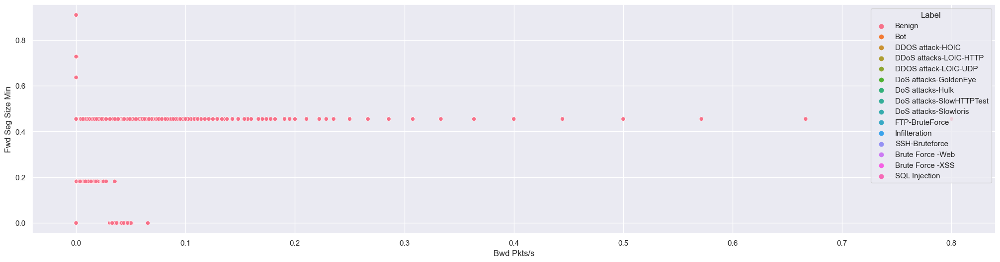

In [16]:
%%time
sns.set(rc={'figure.figsize':(25, 6)})
sns.scatterplot(x=network_data['Bwd Pkts/s'][:50000], y=network_data['Fwd Seg Size Min'][:50000], 
                hue='Label', data=network_data)

In [17]:
# check the dtype of timestamp column
(network_data['Timestamp'].dtype)

dtype('float64')

In [18]:
cleaned_data=network_data 

In [19]:
# encode the column labels
label_encoder = LabelEncoder()
cleaned_data['Label']= label_encoder.fit_transform(cleaned_data['Label'])
cleaned_data['Label'].unique()

array([ 0,  1,  4,  6,  5,  7,  8,  9, 10, 11, 12, 14,  2,  3, 13])

In [20]:
cleaned_data['Label'].value_counts()

Label
0     4836398
6      573347
8      439126
4      360833
1      285763
11     193354
14     187589
12     152874
9      139890
7       39924
10       2724
5        1730
2         350
3         116
13         78
Name: count, dtype: int64

In [22]:
# make 2 seperate datasets for 2 feature labels
data_1 = cleaned_data[cleaned_data['Label'] == 0]
data_2 = cleaned_data[cleaned_data['Label'].isin(range(1,15))]

# make benign feature
y_1 = np.zeros(data_1.shape[0])
y_benign = pd.DataFrame(y_1)

# make malicious feature
y_2 = np.ones(data_2.shape[0])
y_mali = pd.DataFrame(y_2)


# merging the original dataframe
X = pd.concat([data_1, data_2], sort=True)
y = pd.concat([y_benign, y_mali], sort=True)

In [23]:
y_1, y_2

(array([0., 0., 0., ..., 0., 0., 0.]), array([1., 1., 1., ..., 1., 1., 1.]))

In [24]:
print(X.shape)
print(y.shape)

(7214096, 71)
(7214096, 1)


In [38]:
# checking if there are some null values in data
X.isnull().sum().to_numpy()

array([      0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0,       0,       0,       0, 6067402,       0,       0,
             0,       0,       0,       0,       0,       0,       0,
             0], dtype=int64)

In [39]:
from sklearn.utils import resample

data_1_resample = resample(data_1, n_samples=30000, 
                           random_state=123, replace=True)
data_2_resample = resample(data_2, n_samples=30000, 
                           random_state=123, replace=True)

In [40]:
train_dataset = pd.concat([data_1_resample, data_2_resample])
train_dataset.head(5)

,Dst Port,Protocol,Timestamp,Flow Duration,Tot Fwd Pkts,Tot Bwd Pkts,TotLen Fwd Pkts,TotLen Bwd Pkts,Fwd Pkt Len Max,Fwd Pkt Len Min,...,Active Mean,Active Std,Active Max,Active Min,Idle Mean,Idle Std,Idle Max,Idle Min,Label,Src Port
277869,0.006760,0.352941,0.339082,0.251374,0.021113,0.019680,0.060606,0.004151,0.232192,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0,NaN
6600032,0.006790,0.352941,0.285956,0.002048,0.004619,0.001203,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0,NaN
5540906,0.134068,0.352941,0.643603,0.718357,0.001333,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.718407,0.0,0.718407,0.718407,0,NaN
2460995,0.890591,0.352941,0.060117,0.000017,0.000013,0.016129,0.000094,0.027190,0.420414,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0,NaN
4134767,0.001221,0.352941,0.230098,0.454461,0.003788,0.000000,0.000000,0.000000,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.000000,0.0,0.000000,0.000000,0,NaN


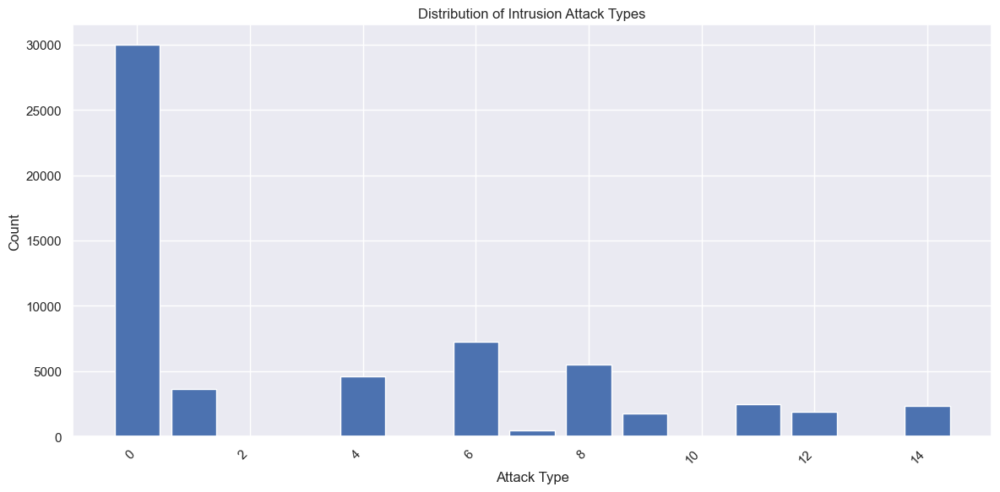

In [43]:
plt.figure(figsize=(12, 6)) 
plt.bar(train_dataset['Label'].value_counts().index, train_dataset['Label'].value_counts())
plt.xlabel('Attack Type')
plt.ylabel('Count')
plt.title('Distribution of Intrusion Attack Types')
plt.xticks(rotation=45, ha='right')
plt.tight_layout() 
plt.show()

ValueError: 'label' must be of length 'x'

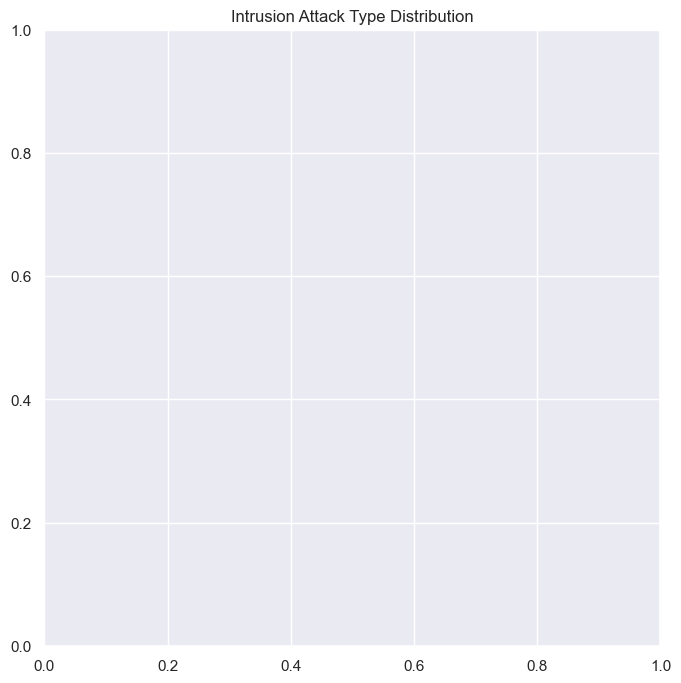

In [42]:
# viewing the distribution of intrusion attacks in our dataset 
plt.figure(figsize=(10, 8))
circle = plt.Circle((0, 0), 0.7, color='white')
plt.title('Intrusion Attack Type Distribution')
plt.pie(train_dataset['Label'].value_counts(), labels=['Benign', 'DDoS attacks-LOIC-HTTP', 'DoS attacks-Hulk', 
                    'DDOS attack-HOIC', 'Bot', 'FTP-BruteForce', 'SSH-Bruteforce', 
                    'Infilteration', 'DoS attacks-SlowHTTPTest', 'DoS attacks-GoldenEye',
                    'DoS attacks-Slowloris', 'DDOS attack-LOIC-UDP', 'Brute Force -Web',
                    'Brute Force -XSS', 'SQL Injection'])
p = plt.gcf()
p.gca().add_artist(circle)

In [44]:
test_dataset = train_dataset.sample(frac=0.1)
target_train = train_dataset['Label']
target_test = test_dataset['Label']
target_train.unique(), target_test.unique()

(array([ 0,  6,  1,  7, 11, 14,  9,  8,  4, 12, 10,  5,  2,  3]),
 array([ 6,  0, 14,  8,  4, 10, 11,  1, 12,  9,  5,  7]))

In [45]:
y_train = to_categorical(target_train, num_classes=15)  
y_test = to_categorical(target_test, num_classes=15)

In [46]:
train_dataset = train_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)
test_dataset = test_dataset.drop(columns = ["Timestamp", "Protocol","PSH Flag Cnt","Init Fwd Win Byts","Flow Byts/s","Flow Pkts/s", "Label"], axis=1)

In [47]:
# making train & test splits
X_train = train_dataset.iloc[:, :-1].values
X_test = test_dataset.iloc[:, :-1].values
X_test

array([[1.22072175e-03, 1.98166412e-01, 1.22503981e-04, ...,
        0.00000000e+00, 2.19838800e-01, 2.19838800e-01],
       [8.08728161e-04, 8.25833347e-06, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [9.06949065e-01, 7.17802358e-01, 1.33333333e-03, ...,
        0.00000000e+00, 7.17851781e-01, 7.17851781e-01],
       ...,
       [8.08740501e-04, 1.04000002e-05, 0.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [1.22072175e-03, 1.94943137e-01, 1.22503981e-04, ...,
        0.00000000e+00, 2.16144030e-01, 2.16144030e-01],
       [1.22072175e-03, 1.57286253e-01, 1.22503981e-04, ...,
        0.00000000e+00, 1.74577871e-01, 1.74577871e-01]])

In [48]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(60000, 63)
(6000, 63)
(60000, 15)
(6000, 15)


In [49]:
# reshape the data for CNN
X_train = X_train.reshape(len(X_train), X_train.shape[1], 1)
X_test = X_test.reshape(len(X_test), X_test.shape[1], 1)
X_train.shape, X_test.shape

((60000, 63, 1), (6000, 63, 1))

In [55]:
# making the deep learning function for CNN
def model():
    inputs = Input(shape=(63,1))
    model = Sequential()
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu', #Convolutional layers learn local patterns within the data.
                    padding='same', input_shape=(63, 1))) 
    model.add(BatchNormalization()) #Batch normalization helps stabilize the training process by normalizing activations across each mini-batch. This can lead to faster convergence and better generalization.
    
    # adding a pooling layer
    model.add(MaxPooling1D(pool_size=(3), strides=2, padding='same')) #Downsampling layers reduce dimensionality and increase the model's receptive field (the region of the input that affects a neuron's output).
    
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu', 
                    padding='same', input_shape=(63, 1)))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=(3), strides=2, padding='same'))
    
    model.add(Conv1D(filters=64, kernel_size=6, activation='relu', 
                    padding='same', input_shape=(63, 1)))
    model.add(BatchNormalization())
    model.add(MaxPooling1D(pool_size=(3), strides=2, padding='same'))

    model.add(Flatten()) #eshapes the multidimensional data into a single vector.
    model.add(Dense(64, activation='relu'))
    model.add(Dense(64, activation='relu')) # Fully connected layers, where each neuron connects to every output from the previous layer. 
    model.add(Dense(15, activation='softmax')) #The output layer with two neurons, matching the number of classes in your classification problem (assuming binary classification). 'softmax' gives probability-like outputs, ensuring the class predictions sum to 1.
    
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    return model

In [56]:
model_instance = model()
model_instance.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv1d_3 (Conv1D)               │ (None, 63, 64)         │           448 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 63, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_3 (MaxPooling1D)  │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_4 (Conv1D)               │ (None, 32, 64)         │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 32, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_4 (MaxPooling1D)  │ (None, 16, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_5 (Conv1D)               │ (None, 16, 64)         │        24,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 16, 64)         │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling1d_5 (MaxPooling1D)  │ (None, 8, 64)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 64)             │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 15)             │           975 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 88,463 (345.56 KB)

 Trainable params: 88,079 (344.06 KB)

 Non-trainable params: 384 (1.50 KB)

In [57]:
logger = CSVLogger('logs.csv', append=True)
his = model_instance.fit(X_train, y_train, epochs=100, batch_size=48, validation_data=(X_test, y_test), callbacks=[logger])

Epoch 1/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 15s 10ms/step - accuracy: 0.9008 - loss: 0.3330 - val_accuracy: 0.9693 - val_loss: 0.1229
Epoch 2/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 14s 11ms/step - accuracy: 0.9666 - loss: 0.0985 - val_accuracy: 0.9190 - val_loss: 0.2360
Epoch 3/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - accuracy: 0.9726 - loss: 0.0782 - val_accuracy: 0.9222 - val_loss: 0.1641
Epoch 4/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - accuracy: 0.9731 - loss: 0.0768 - val_accuracy: 0.9628 - val_loss: 0.0995
Epoch 5/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 13s 10ms/step - accuracy: 0.9732 - loss: 0.0743 - val_accuracy: 0.9750 - val_loss: 0.0737
Epoch 6/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - accuracy: 0.9772 - loss: 0.0629 - val_accuracy: 0.9768 - val_loss: 0.0682
Epoch 7/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - accuracy: 0.9743 - loss: 0.0653 - val_accuracy: 0.9800 - val_loss: 0.0516
Epoch 8/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 12s 10ms/step - accuracy: 

In [58]:
# check the model performance on test data
scores_cnn = model_instance.evaluate(X_test, y_test)
print("%s: %.2f%%" % (model_instance.metrics_names[1], scores_cnn[1] * 100))

188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.9891 - loss: 0.0237
compile_metrics: 98.83%


In [59]:
# check history of model
history = his.history
history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

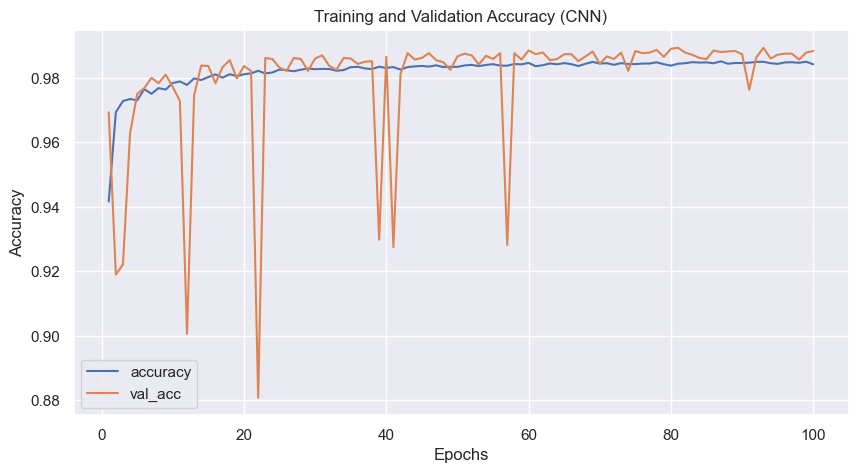

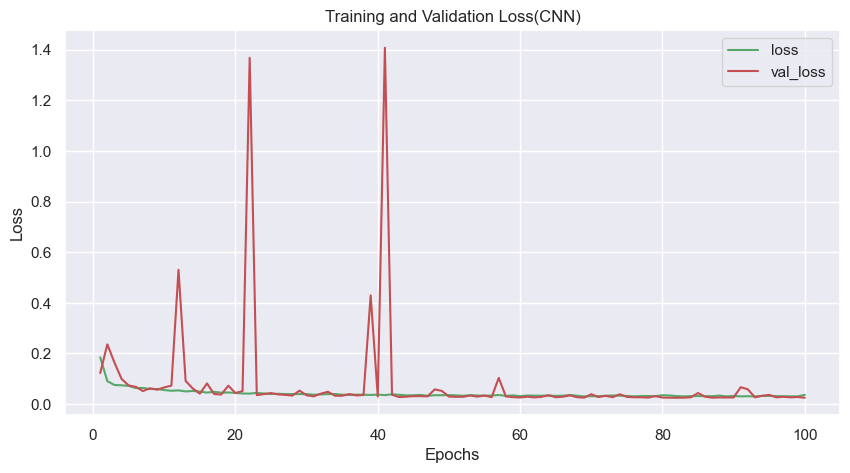

In [60]:
epochs = range(1, len(history['loss']) + 1)
acc = history['accuracy']
loss = history['loss']
val_acc = history['val_accuracy']
val_loss = history['val_loss']

# visualize training and val accuracy
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Accuracy (CNN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(epochs, acc, label='accuracy')
plt.plot(epochs, val_acc, label='val_acc')
plt.legend()

# visualize train and val loss
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Loss(CNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(epochs, loss, label='loss', color='g')
plt.plot(epochs, val_loss, label='val_loss', color='r')
plt.legend()

In [61]:
model_instance.save('my_cnn.h5')

In [68]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras.models import load_model

# Load the trained CNN model
model_instance = load_model('my_cnn.h5')

# Function to preprocess input data
def preprocess_data(input_data):
    # Perform any preprocessing steps here based on how you preprocessed your training data
    
    # For example, if your input_data is a DataFrame with one row:
    # Drop columns not used in training
    input_data = input_data.drop(columns=["Timestamp", "Protocol", "PSH Flag Cnt", "Init Fwd Win Byts", "Flow Byts/s", "Flow Pkts/s"])
    # Encode categorical labels if necessary
    label_encoder = LabelEncoder()
    if 'Label' in input_data.columns:
        input_data['Label'] = label_encoder.fit_transform(input_data['Label'])
    # Ensure the input data has the same number of features as the training data
    # Pad or truncate the input data if necessary
    max_features = 63
    if len(input_data.columns) < max_features:
        input_data = input_data.reindex(columns=input_data.columns.tolist() + ['padding']*(max_features - len(input_data.columns)))
    elif len(input_data.columns) > max_features:
        input_data = input_data[input_data.columns[:max_features]]
    # Return preprocessed data
    return input_data.values.reshape(1, max_features)

# Function to predict using the model
def predict_attack(input_data):
    # Preprocess the input data
    preprocessed_data = preprocess_data(input_data)
    # Make prediction
    prediction = model_instance.predict(preprocessed_data)
    # Decode prediction (if necessary)
    # For binary classification, if prediction > 0.5, it's considered an attack
    
    
    if prediction[0][0] > 0.5:
        return "Benign"
    else:
        return "Malicious"

# Example usage:
# Load your new CSV file containing one row of data
new_data = pd.read_csv('H:/Internetworking/CICIDS_ALLATTACKS_BINARY/test.csv')

# Predict whether it's an attack or not
result = predict_attack(new_data)

print("Prediction:", result)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 162ms/step
Prediction: Benign


In [41]:
## reshape the data for RNN
timesteps = 3
X_train = X_train.reshape(X_train.shape[0], timesteps, X_train.shape[1] // timesteps)
X_test = X_test.reshape(X_test.shape[0], timesteps, X_test.shape[1] // timesteps)


ValueError: cannot reshape array of size 3780000 into shape (60000,3,1)

In [93]:
# making the deep learning function for RNN
model = tf.keras.Sequential([
    LSTM(64, return_sequences=True, input_shape=(timesteps, X_train.shape[2])), # LSTM layer
    LSTM(64),  # Additional LSTM layer (optional)
    Dense(32, activation='relu'), 
    Dense(2, activation='softmax')  # Output layer
])


C:\Users\Le Gia Bach\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [94]:
model.compile(loss='categorical_crossentropy', 
              optimizer='adam', 
              metrics=['accuracy']) 

In [95]:
his_rnn = model.fit(X_train, y_train, epochs=100, batch_size=48, validation_data=(X_test, y_test))

Epoch 1/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 11s 6ms/step - accuracy: 0.8682 - loss: 0.3334 - val_accuracy: 0.9370 - val_loss: 0.1841
Epoch 2/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9371 - loss: 0.1804 - val_accuracy: 0.9430 - val_loss: 0.1653
Epoch 3/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9440 - loss: 0.1638 - val_accuracy: 0.9582 - val_loss: 0.1458
Epoch 4/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9514 - loss: 0.1460 - val_accuracy: 0.9587 - val_loss: 0.1286
Epoch 5/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9580 - loss: 0.1282 - val_accuracy: 0.9637 - val_loss: 0.1110
Epoch 6/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.9624 - loss: 0.1114 - val_accuracy: 0.9597 - val_loss: 0.1106
Epoch 7/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.9638 - loss: 0.1054 - val_accuracy: 0.9692 - val_loss: 0.0977
Epoch 8/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9672 - loss: 

In [ ]:
scores_rnn = model.evaluate(X_test, y_test)
print("%s: %.2f%%" % (model_instance.metrics_names[1], scores_rnn[1] * 100))

188/188 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - accuracy: 0.9837 - loss: 0.0355
compile_metrics: 98.33%


In [ ]:
# check history of model
history = his_rnn.history
history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

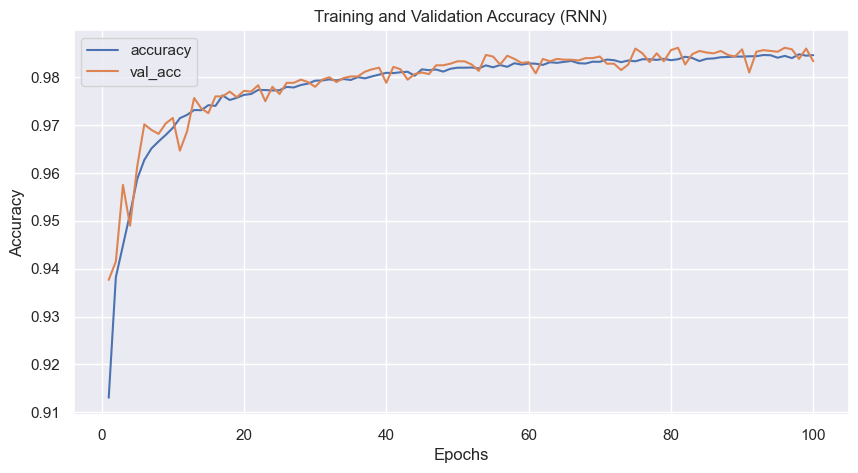

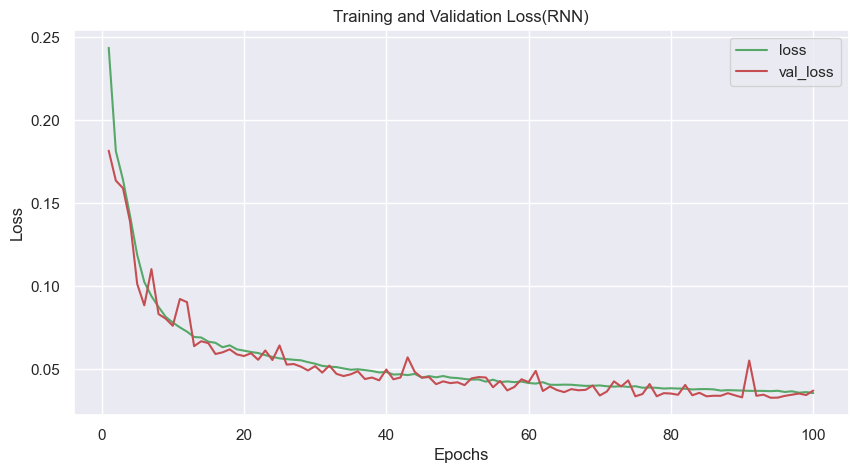

In [ ]:
epochs = range(1, len(history['loss']) + 1)
acc = history['accuracy']
loss = history['loss']
val_acc = history['val_accuracy']
val_loss = history['val_loss']

# visualize training and val accuracy
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Accuracy (RNN)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(epochs, acc, label='accuracy')
plt.plot(epochs, val_acc, label='val_acc')
plt.legend()

# visualize train and val loss
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Loss(RNN)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(epochs, loss, label='loss', color='g')
plt.plot(epochs, val_loss, label='val_loss', color='r')
plt.legend()

In [ ]:
# Sample data with 3 dimensions (assuming the third dimension is size 1)
X_train = np.random.rand(60000, 63, 1) 
X_test = np.random.rand(6000, 63, 1)

In [ ]:
# Reshape to 2D for standardization
try:
  X_train = X_train.reshape(len(X_train), X_train.shape[1])  
  X_test = X_test.reshape(len(X_test), X_test.shape[1])
  print("Reshaping successful!")
except ValueError as e:
  print("Reshaping failed:", e)

Reshaping successful!


In [ ]:
#Standardize Features (Good Practice for MLPs)
scaler = StandardScaler() 
X_train = scaler.fit_transform(X_train) 
X_test = scaler.transform(X_test) 

In [ ]:
#Define MLP Architecture
model = Sequential()
model.add(Dense(32, activation='relu', input_shape=(X_train.shape[1],)))  # Input layer 
model.add(Dense(16, activation='relu'))                                  # Hidden layer
model.add(Dense(2, activation='softmax'))  

C:\Users\Le Gia Bach\AppData\Roaming\Python\Python311\site-packages\keras\src\layers\core\dense.py:88: UserWarning:

Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.



In [ ]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [ ]:
his_mlp = model.fit(X_train, y_train, epochs=100, batch_size=48, validation_data=(X_test, y_test))

Epoch 1/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 2s 1ms/step - accuracy: 0.5020 - loss: 0.7091 - val_accuracy: 0.4987 - val_loss: 0.6951
Epoch 2/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 904us/step - accuracy: 0.5166 - loss: 0.6920 - val_accuracy: 0.5062 - val_loss: 0.6951
Epoch 3/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 973us/step - accuracy: 0.5296 - loss: 0.6895 - val_accuracy: 0.5028 - val_loss: 0.6956
Epoch 4/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 922us/step - accuracy: 0.5413 - loss: 0.6878 - val_accuracy: 0.5080 - val_loss: 0.6987
Epoch 5/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 953us/step - accuracy: 0.5512 - loss: 0.6858 - val_accuracy: 0.5070 - val_loss: 0.7001
Epoch 6/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 840us/step - accuracy: 0.5550 - loss: 0.6828 - val_accuracy: 0.5087 - val_loss: 0.7008
Epoch 7/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 819us/step - accuracy: 0.5669 - loss: 0.6789 - val_accuracy: 0.4998 - val_loss: 0.7033
Epoch 8/100
1250/1250 ━━━━━━━━━━━━━━━━━━━━ 1s 887us/step - accuracy: 0.

In [ ]:
scores_mlp = model.evaluate(X_test, y_test)
print("%s: %.2f%%" % (model_instance.metrics_names[1], scores_mlp[1] * 100))

188/188 ━━━━━━━━━━━━━━━━━━━━ 0s 688us/step - accuracy: 0.4947 - loss: 0.7690
compile_metrics: 49.72%


In [ ]:
# check history of model
history = his_mlp.history
history.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

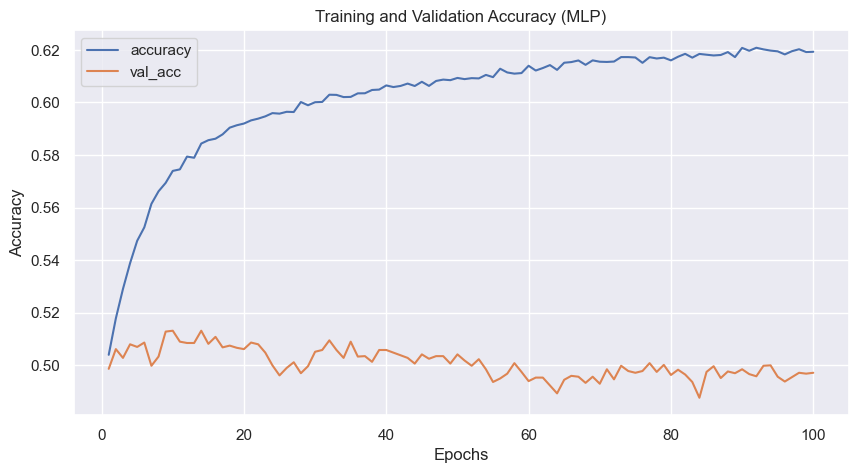

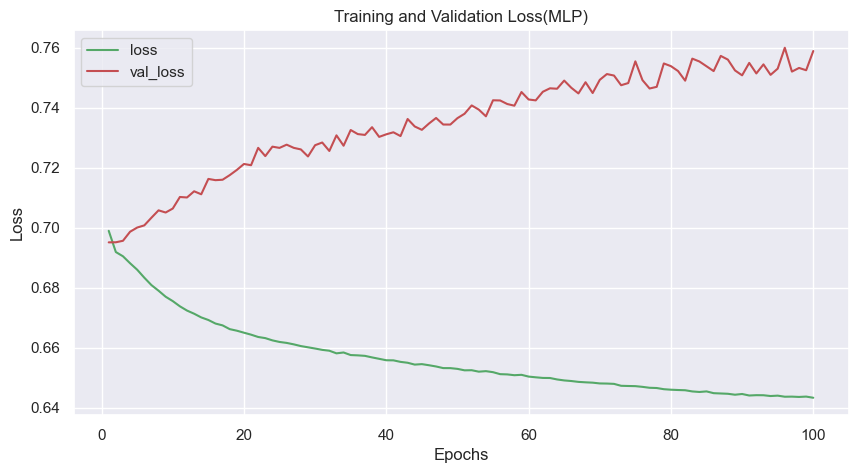

In [ ]:
epochs = range(1, len(history['loss']) + 1)
acc = history['accuracy']
loss = history['loss']
val_acc = history['val_accuracy']
val_loss = history['val_loss']

# visualize training and val accuracy
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Accuracy (MLP)')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.plot(epochs, acc, label='accuracy')
plt.plot(epochs, val_acc, label='val_acc')
plt.legend()

# visualize train and val loss
plt.figure(figsize=(10, 5))
plt.title('Training and Validation Loss(MLP)')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.plot(epochs, loss, label='loss', color='g')
plt.plot(epochs, val_loss, label='val_loss', color='r')
plt.legend()